<a href="https://colab.research.google.com/github/falseywinchnet/PyITD/blob/main/Signed_Short_Time_Discrete_Phase_Transform.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The SST-DPT(Signed Short Time-Discrete Phase Transform) is a transform that uses the signdedness of samples to extract phase information on frequency components. The short time aspects of the algorithm are left out of the equation for the core algorithm, which is the Signed Discrete Phase Transform
Note that this algorithm is incompatible with DFT cisoid centering


$SDPT(x) = \sum_{i=0}^{N-1} \prod_{j=0}^{N-1} \sin\left(\frac{2\pi j}{N}i + \pi \cdot \mathbb{1}_{x_i < 0}\right)$

output between 1, -1

it can also be(with less efficiency) represented as

$SDPT(x) = \sum_{i=0}^{n-1} \prod_{j=0}^{n-1} \left[ \left( \frac{2\pi j}{n} + \alpha_i = \begin{cases} 0 & \text{if } x_i \geq 0 \\ \pi & \text{if } x_i < 0 \end{cases}
\right) \bmod 2\pi - \pi \right]$

output between pi, -pi

The cost optimization of this algorithm is of highest interest.
Finding a contemporary extant algorithm like this so that the author does not embarrass themselves by claiming or believing themselves to have invented something new is also important.
Any information on either objective, as well as assistance getting published on arxiv(where author is not endorsed) would be appreciated

sincerely, joshuah.rainstar@gmail.com

MIT/GPL licensed 2024

In [5]:
import IPython
import scipy
from scipy.io import wavfile
import soundfile as sf
import matplotlib.pyplot as plt
import urllib.request
import numpy as np
import numba
import numpy
import librosa
import io
%matplotlib inline

url = "https://github.com/falseywinchnet/PyITD/raw/main/Dave%20and%20Simon%2C%203.79%20MHz%2C%20LSB.wav"
#url=  "https://github.com/falseywinchnet/PyITD/raw/main/girl.wav" #alt source- a female recording
#this is an noisy shortwave conversation I got from a friend. I use it to test denoising methods.
#it is reasonably normalized and features a good noise diversity.
response = urllib.request.urlopen(url)
data, rate = sf.read(io.BytesIO(response.read()))

In [239]:
@numba.jit()
def compute_phases(N, idx, val):
    constant_factor = idx / N
    phases = np.arange(N,dtype=numpy.float64)
    phases *= constant_factor * np.pi  # Scale the range to [-pi, 0]
    phases += np.pi * (val > 0)  # Shift the range by pi if val > 0
    phases = np.sin(phases)  # Apply the sine function
    return phases #more efficient representation from [1..-1]


#signed discrete phase transform
@numba.jit()
def sdpt(input_array):
    output = np.zeros(input_array.size,dtype=np.float64)
    for each in range(input_array.size):
        output[:] += compute_phases(input_array.size,each,input_array[each])
    return output

<ipython-input-239-135e694d9f0b>:1: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
<ipython-input-239-135e694d9f0b>:12: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()


In [249]:
def stpt(x:np.ndarray) -> np.ndarray:


    n_fft = 2048 #also the segment length
    hop_len = 128

    xp = np.zeros(x.size+n_fft-1,dtype=np.float64)
    before = n_fft//2
    after = n_fft//2 -1
    xp[before:-after]= x[:]
    xp[0:before] = xp[before+1:(before*2)+1][::-1]
    xp[-after:] = xp[-after*2-1:-before][::-1]

    #Calculate parameters
    n_overlap = n_fft - hop_len
    hop_len = n_fft - n_overlap
    n_segs = (xp.shape[-1] - n_fft) // hop_len + 1
    s20 = int(np.ceil(n_fft / 2))
    s21 = s20 - 1 if (n_fft % 2 == 1) else s20

    # Segmentation
    Sx = np.zeros((n_fft, n_segs), dtype=np.float64)
    strides = (xp.strides[0], hop_len * xp.strides[0])

    starts = np.arange(n_segs) * hop_len
    first_half = np.lib.stride_tricks.as_strided(xp[s21:], (s20, n_segs), strides)
    second_half = np.lib.stride_tricks.as_strided(xp, (s21, n_segs), strides)

    Sx[:s20, :] = second_half
    Sx[s20:, :] = first_half

    Zx = numpy.zeros((n_fft,n_segs),dtype=numpy.complex128)

    for each in range(n_segs):
        Zx[:,each] = sdpt(Sx[:,each])

    return Zx

In [250]:
p = (numpy.asarray(stpt(data[0:rate])))


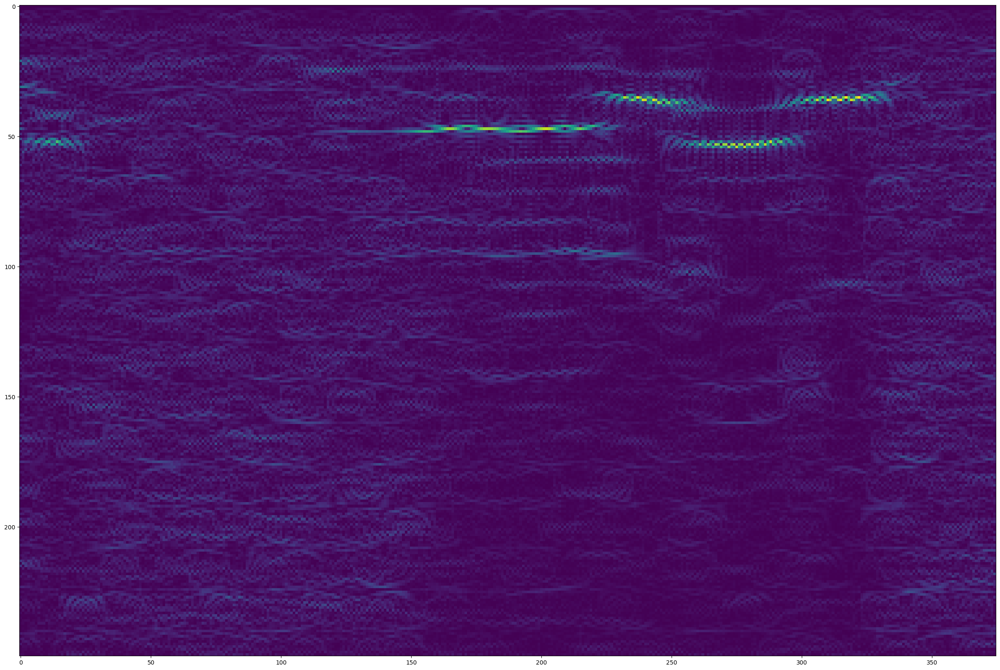

In [251]:
plt.figure(figsize=(30,30))
plt.imshow(numpy.abs(p[:250]))

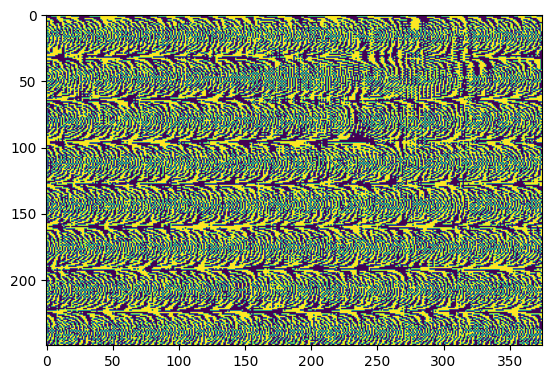

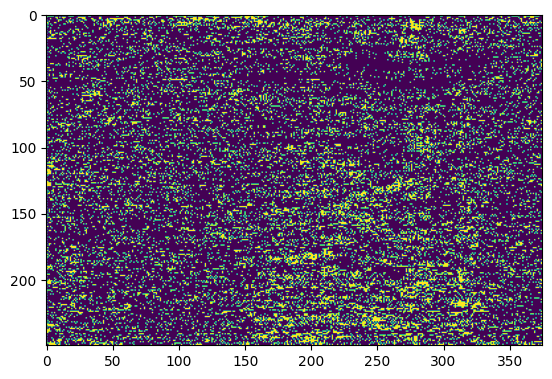

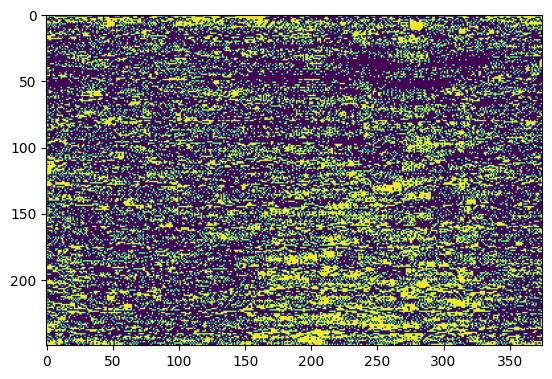

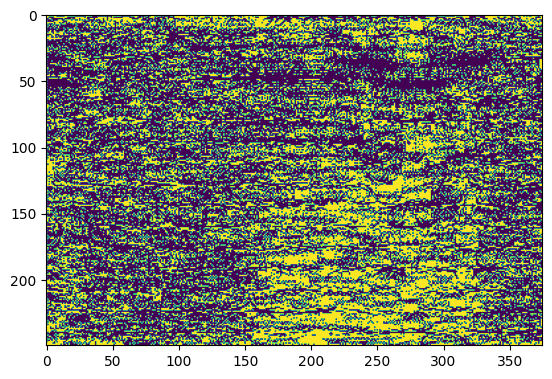

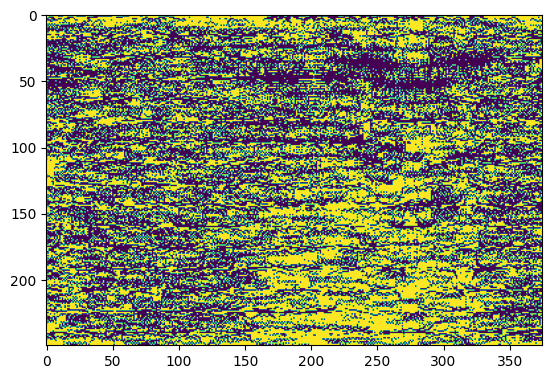

...

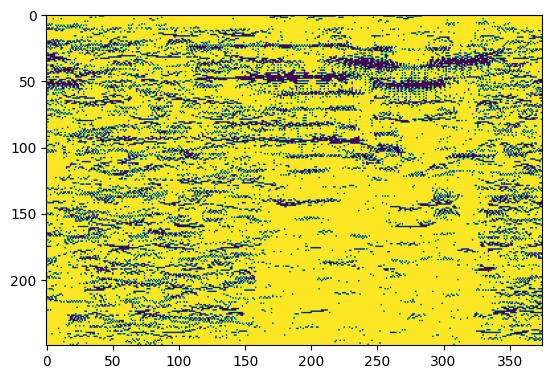

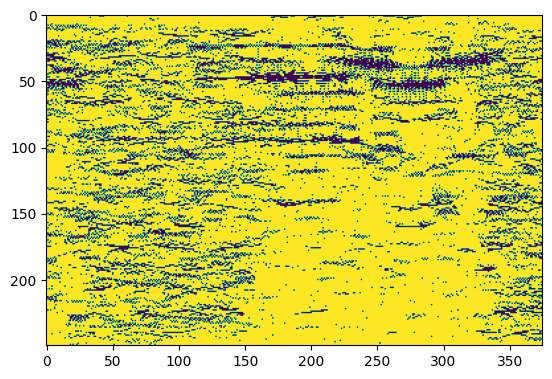

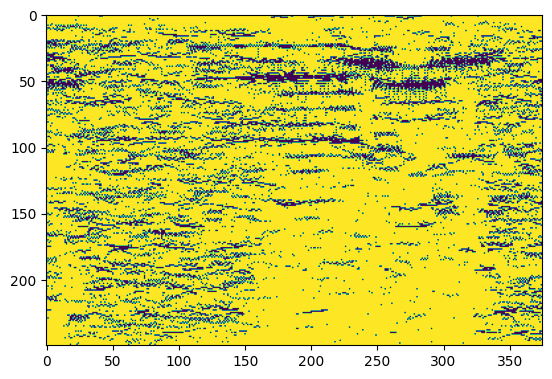

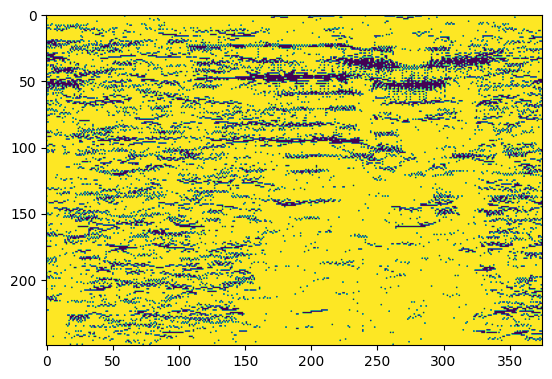

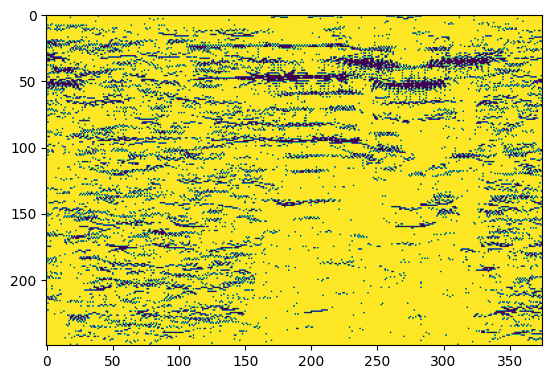

In [286]:


def loop(input:numpy.ndarray):
  p1 = numpy.fft.rfft(input,axis=0)
  p1[0,:] *= 0.0 #clear dc contribution
  p2 = numpy.angle(numpy.fft.irfft(p1,axis=0))
  plt.imshow(numpy.abs(p2)[:250])
  plt.show()
  px = numpy.fft.rfft(p2,axis=0)
  pz = p1+px

  return numpy.abs(numpy.fft.irfft(pz,axis=0))

iter = p.copy()
for i in range(25):
    iter = numpy.abs(loop(iter))


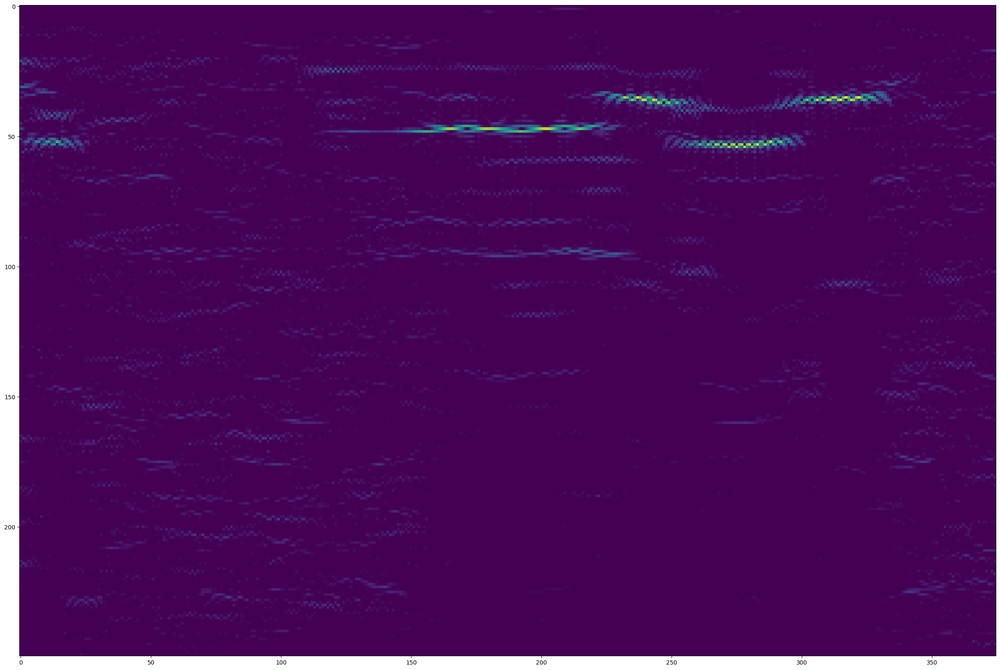

In [287]:
plt.figure(figsize=(30,30))
plt.imshow(numpy.abs(iter[:250]))

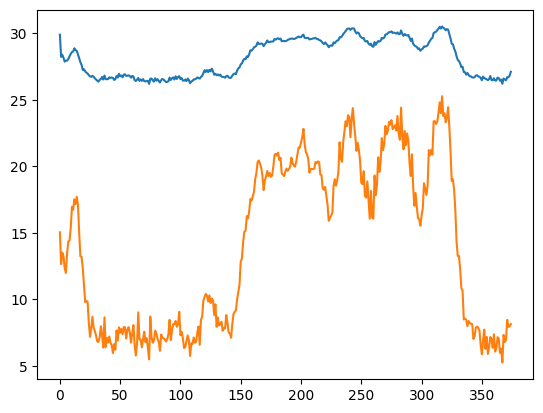

In [288]:
plt.plot(numpy.std(numpy.abs(p),axis=0))
plt.plot(numpy.std(numpy.abs(iter),axis=0))